# PCA on UKBB Meshes

In [2]:
%load_ext autoreload
%autoreload 1

In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import pandas as pd

import os
os.system('/usr/bin/Xvfb :99 -screen 0 1024x768x24 &')
os.environ['DISPLAY'] = ':99'

import panel as pn
pn.extension('vtk')

import pyvista as pv
pv.set_plot_theme("document")

from coma.datasets.ukbb_meshdata import UKBBMeshDataset
from coma.utils import transforms
from coma.utils.decomposition import PCAShapeModel3D
from coma.utils.visualise import plot_single_mesh, plot_mesh, plot_mesh_pyvista

In [4]:
%aimport coma.utils.decomposition

In [5]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

## Load Dataset

In [6]:
brain_substructure = 'BrStem'

In [7]:
%%bash
ls "/vol/bitbucket/rrr2417/deepscm_data_cache"

data_subject_ids_Br_Stem.pickle
data_subject_ids_BrStem.pickle
data_subject_ids_R_Hipp.pickle
flat_list_Br_Stem.pickle
flat_list_BrStem.pickle
flat_list_R_Hipp.pickle
lookup_dict_Br_Stem.pickle
lookup_dict_BrStem.pickle
lookup_dict_R_Hipp.pickle


In [8]:
# Preprocessor
preprocessor = transforms.get_transforms()

# Load Dataset
mesh_path = "/vol/biomedic3/bglocker/brainshapes"
cache_path = "/vol/bitbucket/rrr2417/deepscm_data_cache"
csv_path = "/vol/biomedic3/bglocker/brainshapes/ukb21079_extracted.csv"
split = 0.8

substructure_to_udi = {
    'BrStem': '25025-2.0', 
    'L_Thal': '25011-2.0',
    'L_Caud': '25013-2.0',
    'L_Puta': '25015-2.0',
    'L_Pall': '25017-2.0',
    'L_Hipp': '25019-2.0',
    'L_Amyg': '25021-2.0',
    'L_Accu': '25023-2.0',
    'R_Thal': '25012-2.0',
    'R_Caud': '25014-2.0',
    'R_Puta': '25016-2.0',
    'R_Pall': '25018-2.0',
    'R_Hipp': '25020-2.0',
    'R_Amyg': '25022-2.0',
    'R_Accu': '25024-2.0',
}

feature_name_map = {
    '31-0.0': 'sex',
    '21003-0.0': 'age',
    substructure_to_udi[brain_substructure]: 'structure_volume',  # Brain Stem
    '25010-2.0': 'brain_volume',  # Unnormalised brain volume from UKBB
}

metadata_df = pd.read_csv(csv_path)

total_train_dataset = UKBBMeshDataset(
    mesh_path,
    substructures=[brain_substructure],
    split=split,
    train=True,
    transform=preprocessor,
    reload_path=True,
    features_df=metadata_df,
    feature_name_map=feature_name_map,
    cache_path=cache_path,
)

/vol/bitbucket/rrr2417/deepscm/ENV2/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3155: DtypeWarning: Columns (255,273,274,275,279,351,451,452,453,454,1344,1347,1350,1351,1352,1396,1397,1398,1399,1400,1401,1402,1428,1429,1430,1431,1432,1433,1434,1492,1596,1597,1598,1599,1600,1601,1602,1603,1604,1605,1606,1607,1608,1609,1610,1611,1612,1613,1614,1615,1616,1968,2012,2013,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024,2025,2026,2027,2028,2029,2030,2031,2032,2033,2034,2035,2036,2037,2038,2039,2040,2041,2042,2043,2044,2045,2046,2047,2048,2049,2050,2051,2052,2053,2054,2055,2056,2057,2058,2059,2060,2061,2062,2063,2064,2065,2066,2431) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [9]:
len(total_train_dataset)

11601

In [10]:
template_path = '/vol/biomedic3/bglocker/brainshapes/5026976/T1_first-BrStem_first.vtk'
template = pv.read(template_path)
faces = template.faces.T.reshape(-1, 4)[:, 1:]

In [11]:
data = [total_train_dataset[i] for i in range(11000)]
meshes = torch.cat([mesh for (mesh, _) in data], 0).detach().numpy()
print(meshes.shape)
features = pd.concat([df for (_, df) in data], 0)
print(features.shape)
features.head()

(11000, 642, 3)
(11000, 5)


,eid,sex,age,structure_volume,brain_volume
4367,1000596,1,54,30672,1331850
10908,1000811,1,46,24685,1255420
829,1000845,1,54,24183,1155230
4846,1001078,1,62,24390,1200210
2299,1001494,1,49,22527,1329680


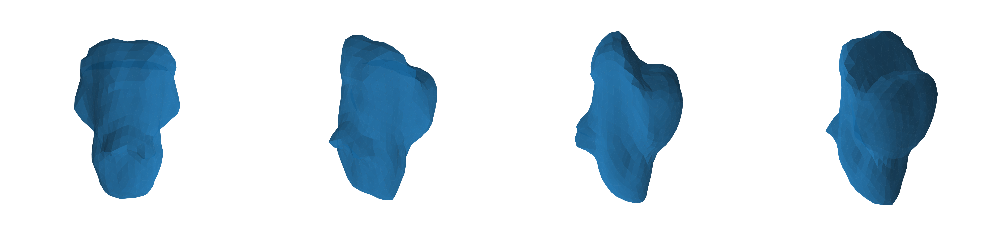

In [12]:
from scipy.spatial.transform import Rotation as R

axis_scaling = [1, 1, 1.5]

rot_transform = R.from_rotvec([0, 0, np.pi * 0.5])
mean_mesh = meshes.mean(axis=0)
mean_mesh = rot_transform.apply(mean_mesh)

plot_mesh(
    mean_mesh,
    faces,
    figsize=(80, 50),
    elevations=[20],
    azimuths=4,
    max_azimuth=180,
    axis_scaling=axis_scaling,
    hide_grid=True,
    antialias=True,
)

## Shape Modelling

In [13]:
%aimport coma.utils.visualise, coma.utils.mesh_sampling

In [14]:
shape_model = coma.utils.decomposition.PCAShapeModel3D()
shape_model.fit(meshes)

HERE


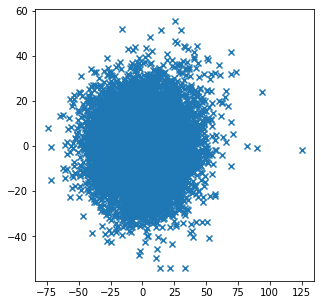

In [15]:
meshes_2d_proj = shape_model.project(meshes, dim=2)
plt.figure(figsize=(5, 5))
plt.scatter(
    meshes_2d_proj[:, 0],
    meshes_2d_proj[:, 1],
    marker='x'
)
plt.show()

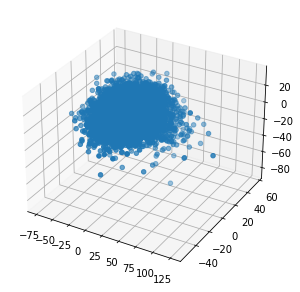

In [16]:
meshes_3d_proj = shape_model.project(meshes, dim=3)
plt.figure(figsize=(5, 5))
ax = plt.axes(projection='3d')
ax.scatter3D(
    meshes_3d_proj[:, 0],
    meshes_3d_proj[:, 1],
    meshes_3d_proj[:, 2],
)
plt.show()

### PCA Shape Model

#### All Shapes

In [17]:
shape_model = coma.utils.decomposition.PCAShapeModel3D()
shape_model.fit(meshes)

HERE


Mode: 1


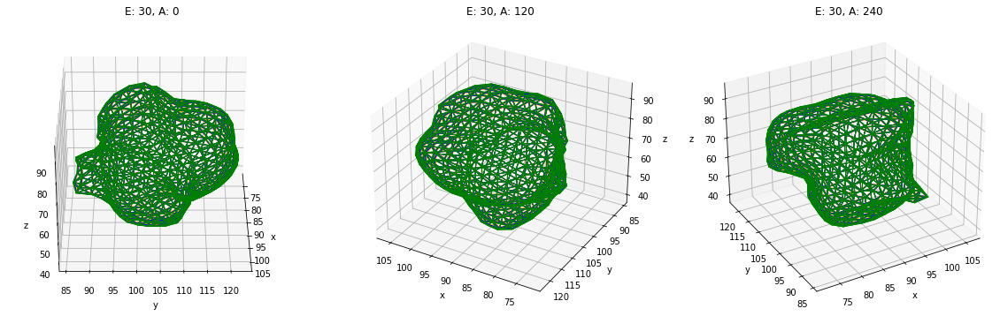

Mode: 2


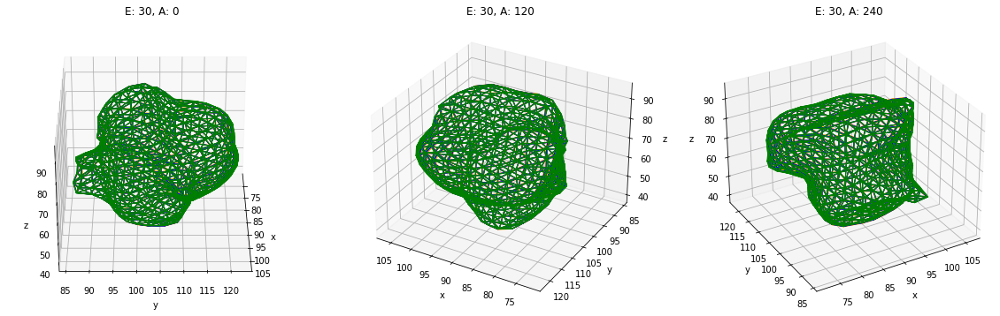

Mode: 3


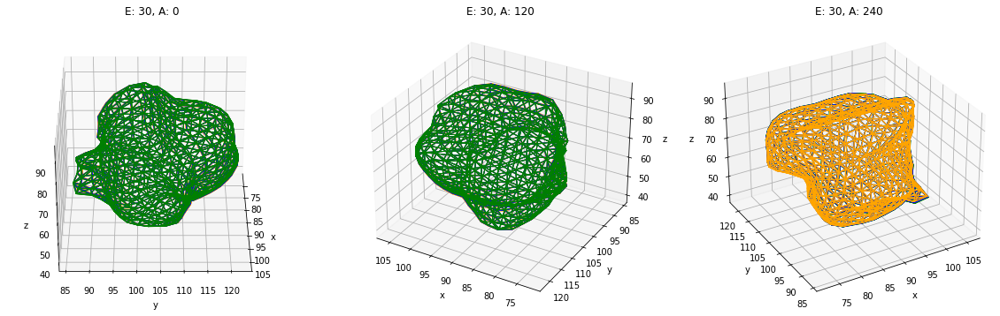

Mode: 4


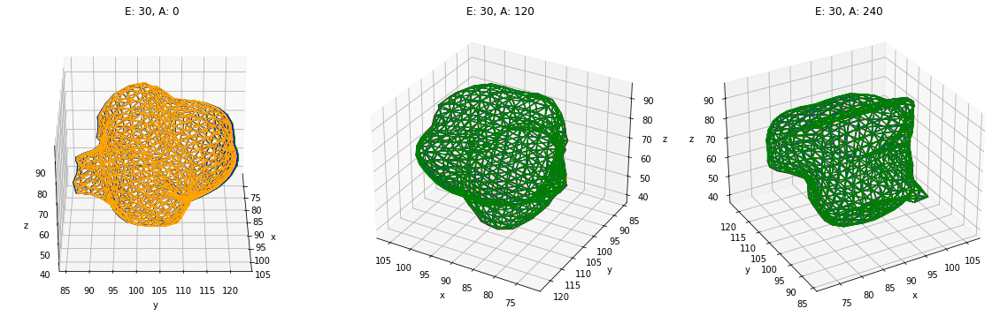

Mode: 5


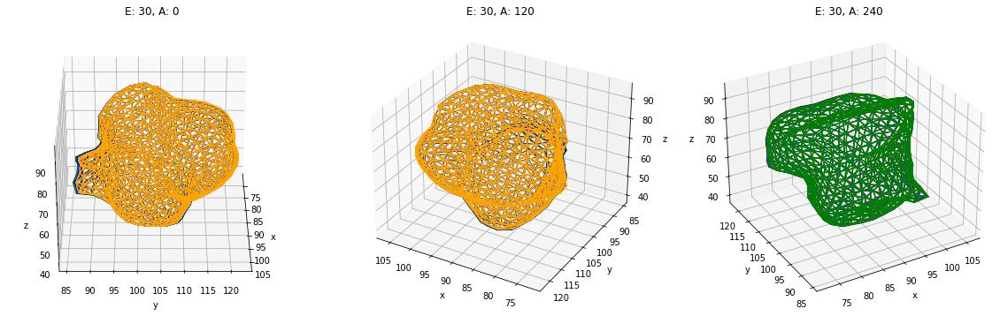

Mode: 6


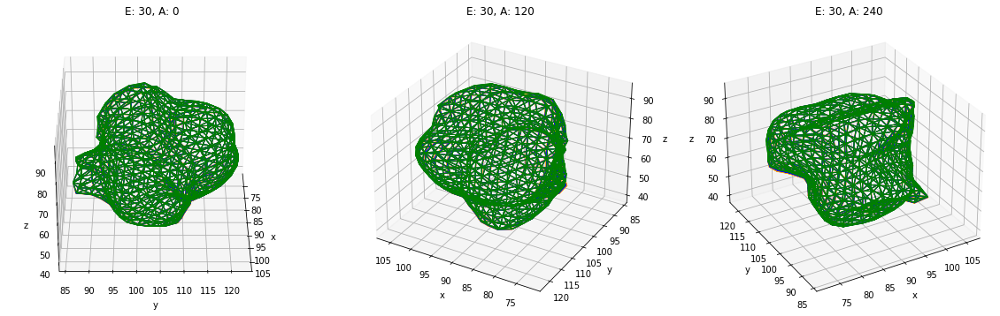

Mode: 7


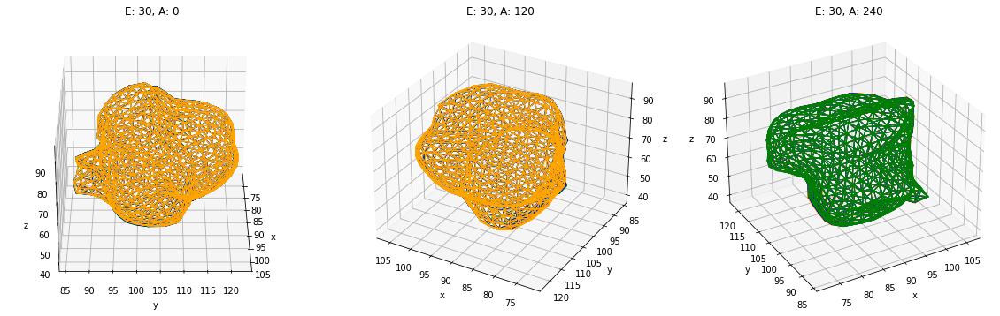

Mode: 8


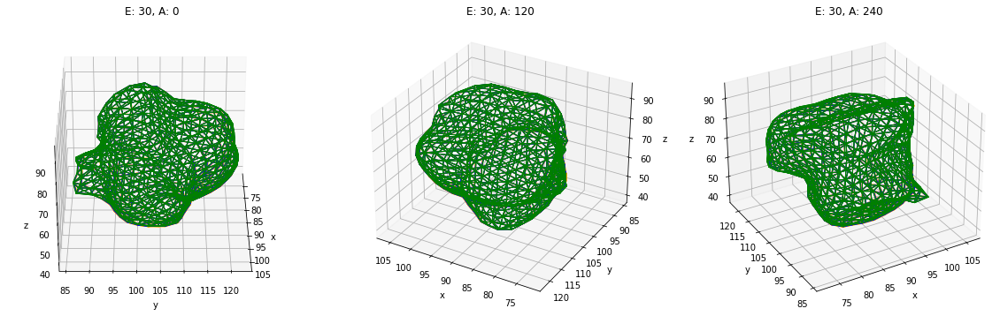

In [18]:
for mode in range(0, 8):
    print(f'Mode: {mode + 1}')
    (mode_1_pos, mode_1_neg) = shape_model.mode(mode, 3)
    mode_1 = np.concatenate([
        np.expand_dims(mode_1_pos, 0),
        np.expand_dims(shape_model.mean, 0),
        np.expand_dims(mode_1_neg, 0),
    ])
    edge_colors = ['orange', 'blue', 'green']
    labels = ['+ve', 'mean', '-ve']
    coma.utils.visualise.plot_wireframes(
        mode_1,
        faces,
        elevations=[30],
        azimuths=3,
        edge_colors=edge_colors,
        labels=labels,
    )

Mode: 1


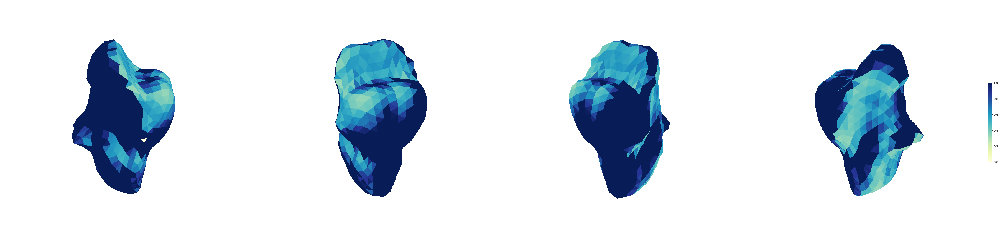

Mode: 2


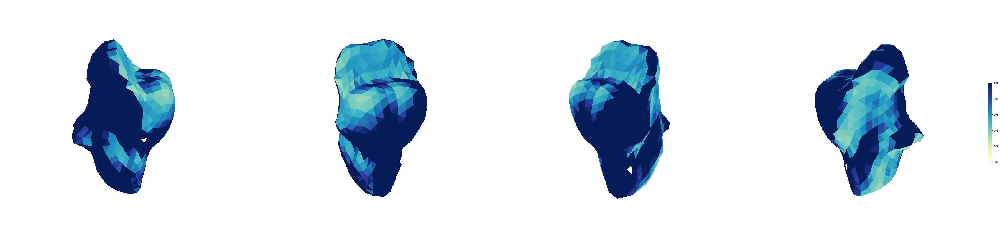

Mode: 3


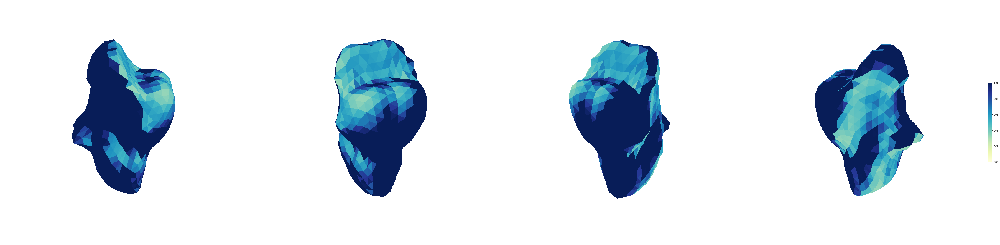

In [19]:
ref_normals = coma.utils.mesh_sampling.get_face_normals(shape_model.mean, faces)
ref_normals.shape

for mode in range(0, 3):
    print(f'Mode: {mode + 1}')
    (mode_pos, _) = shape_model.mode(mode, 1)
    # print(np.expand_dims(mode_normals, 0).shape)
    # print(mode_pos[:10])
    # mode_pos = rot_transform.apply(mode_pos)
    # shape_mean = rot_transform.apply(shape_model.mean)
    mode_normals = coma.utils.mesh_sampling.get_face_normals(mode_pos, faces)
    diff = coma.utils.mesh_sampling.face_normals_similarity(ref_normals, np.expand_dims(mode_normals, 0))
    plot_mesh(
        shape_model.mean,
        faces,
        figsize=(50, 20),
        elevations=[20],
        azimuths=4,
        max_azimuth=270,
        axis_scaling=[1, 1, 1.5],
        alpha=1,
        edgecolor=None,
        facecolors=diff,
        hide_grid=True,
        ax_lims=[(70, 110), (85, 125), (35, 100)],
    )

Mode: 1


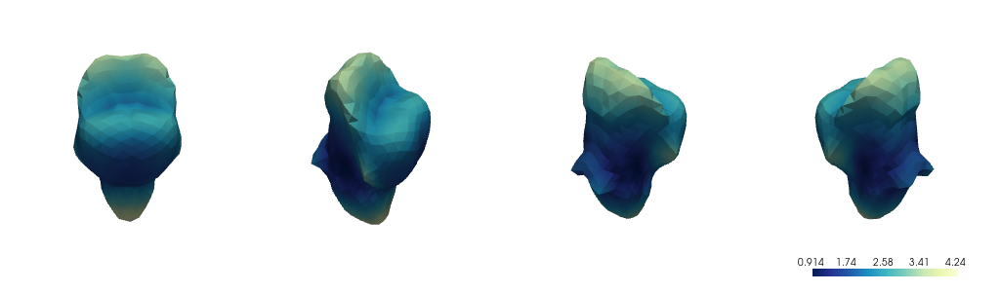

Mode: 2


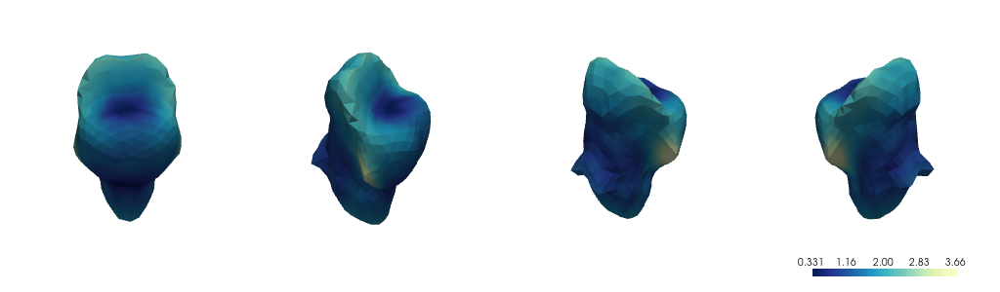

Mode: 3


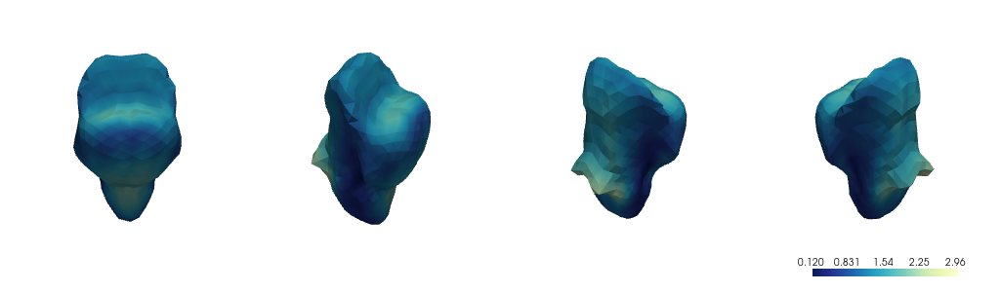

Mode: 4


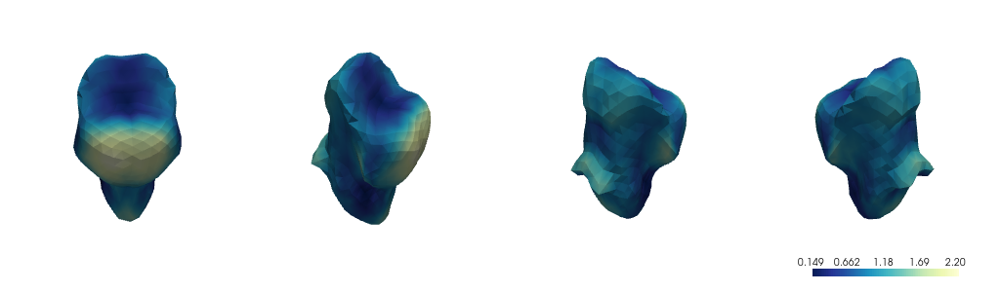

Mode: 5


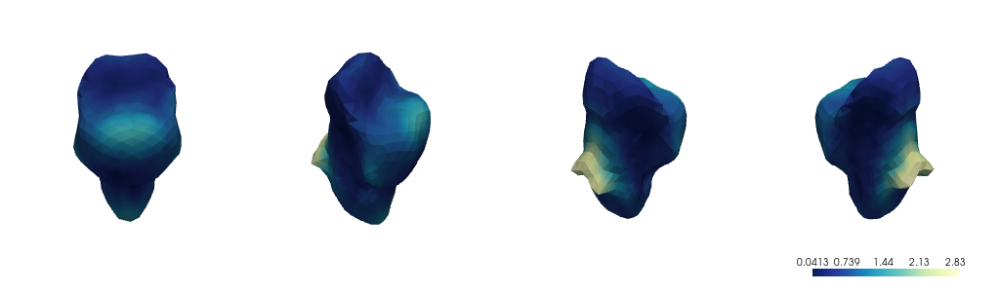

Mode: 6


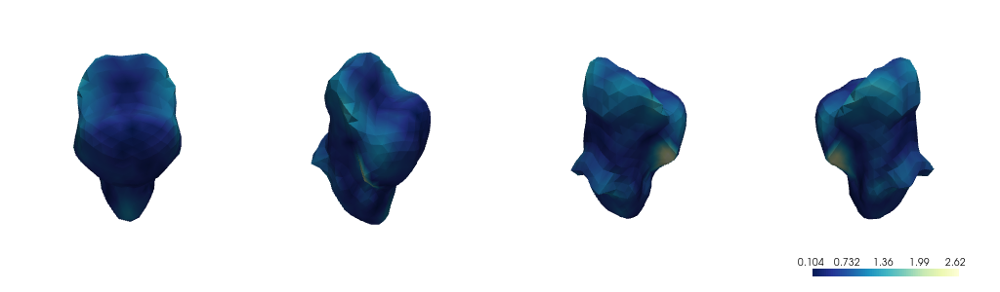

Mode: 7


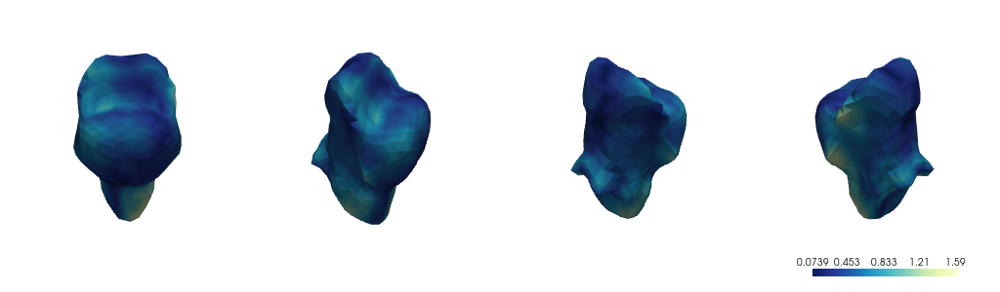

Mode: 8


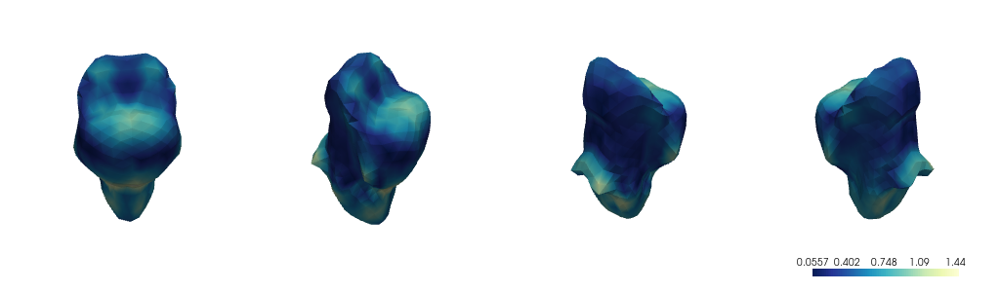

Mode: 9


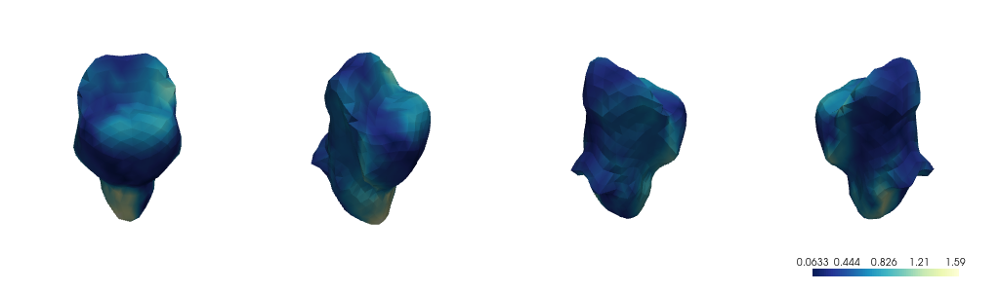

Mode: 10


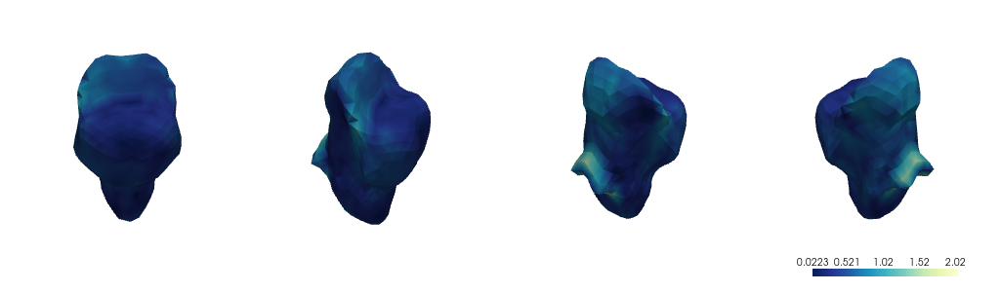

In [24]:
template_copy = template.copy()
template_copy.points = shape_model.mean

modes = 10
diff_maps = np.zeros((modes, 642))

for mode in range(0, modes):
    (mode_pos, _) = shape_model.mode(mode, 3)
    dist = np.linalg.norm(shape_model.mean - mode_pos, axis=1)
    diff_maps[mode] = dist

for mode in range(0, modes):
    print(f'Mode: {mode + 1}')
    plotter = pv.Plotter(
        shape=(1, 4),
        window_size=(1024, 300),
        border=False,
        lighting='light_kit',
        off_screen=True,
        notebook=True,
    )

    plot_mesh_pyvista(
        plotter,
        template_copy,
        rotations=[(0, 0, -45), (0, 0, 20), (0, 0, 85), (0, 0, 185),],
        vertexcolors=list(diff_maps[mode]),
        vertexscalar='distance',
    )

    plotter.show()

#### Filtered by Male vs Female

In [26]:
shape_model_sex_0 = coma.utils.decomposition.PCAShapeModel3D()
shape_model_sex_0.fit(meshes[features.sex.values == 0])

shape_model_sex_1 = coma.utils.decomposition.PCAShapeModel3D()
shape_model_sex_1.fit(meshes[features.sex.values == 1])

Mode: 0
Female


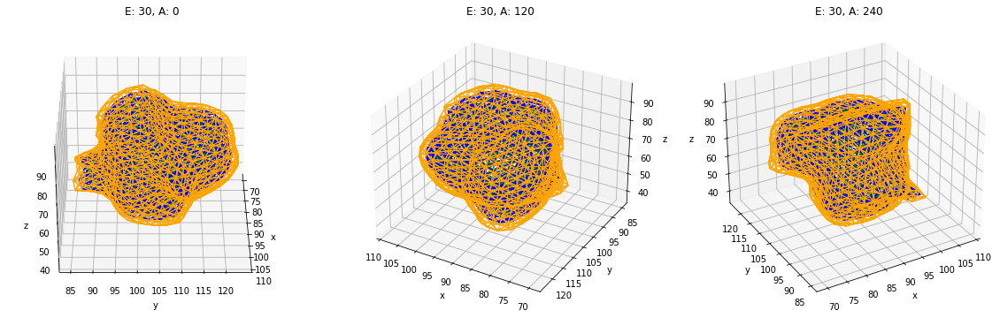

Male


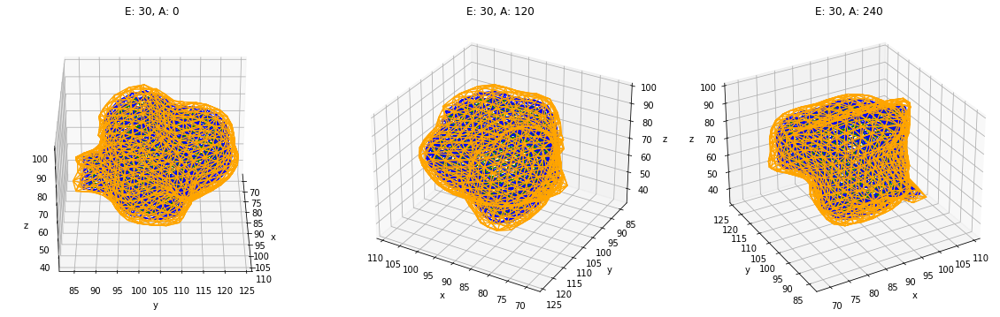

Mode: 1
Female


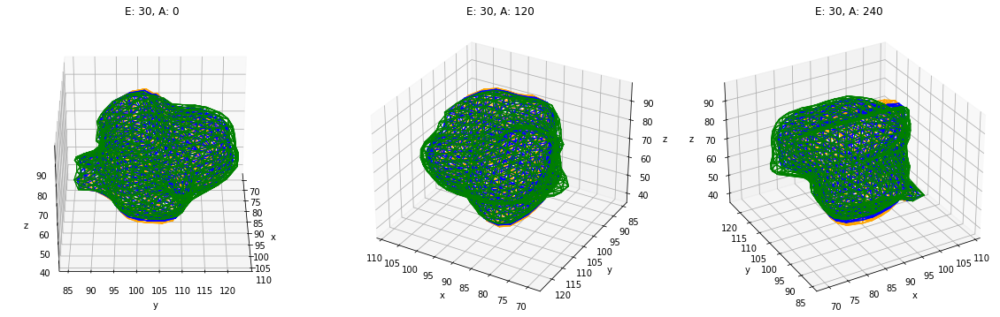

Male


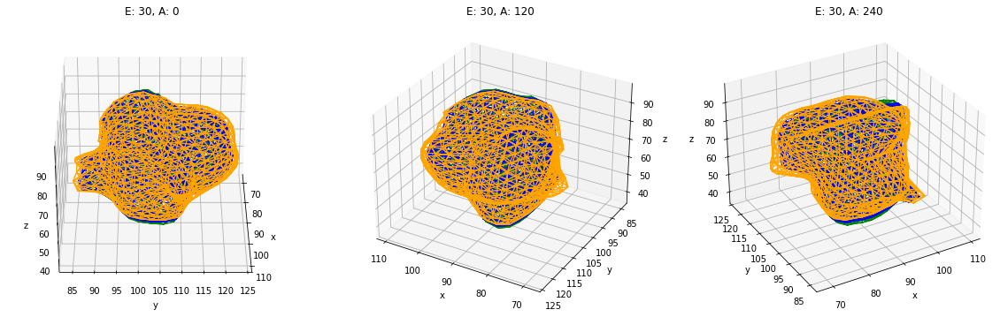

Mode: 2
Female


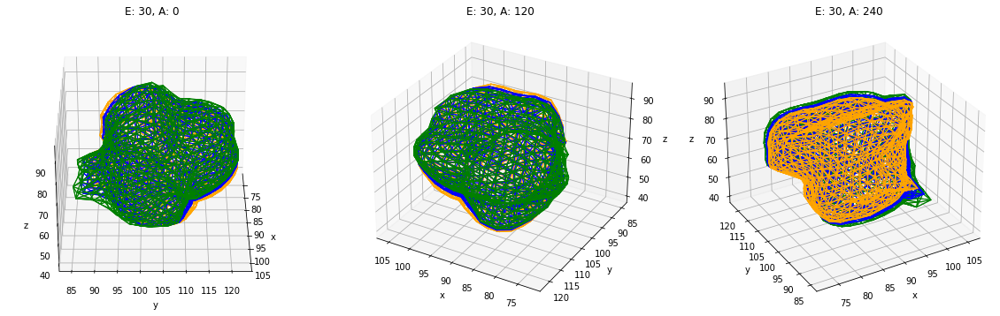

Male


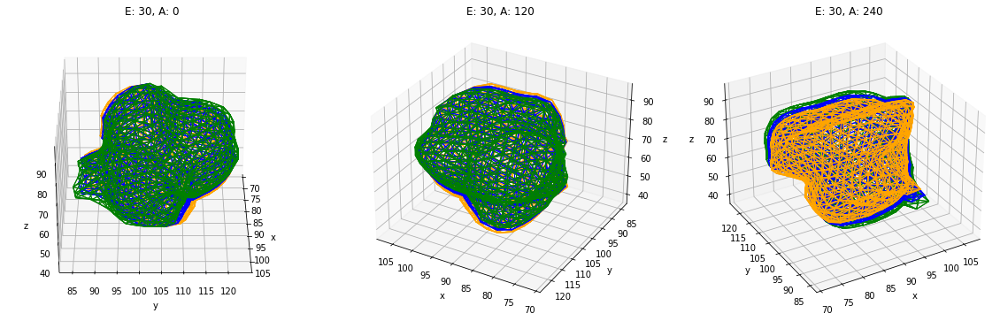

Mode: 3
Female


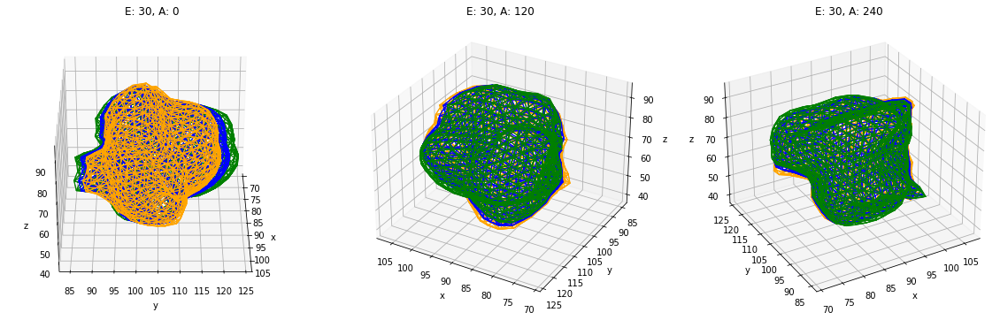

Male


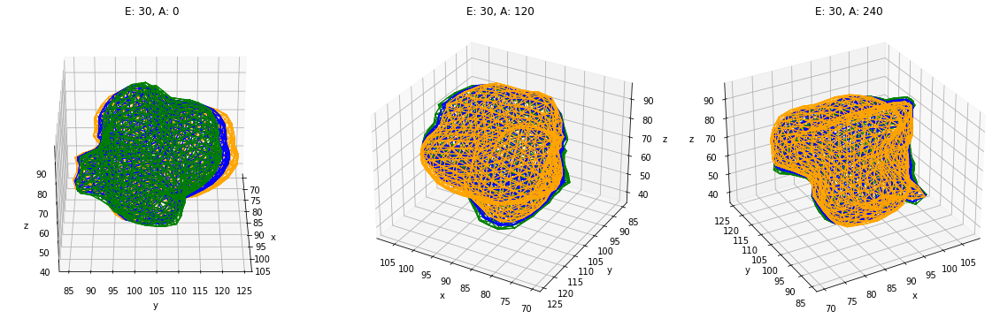

Mode: 4
Female


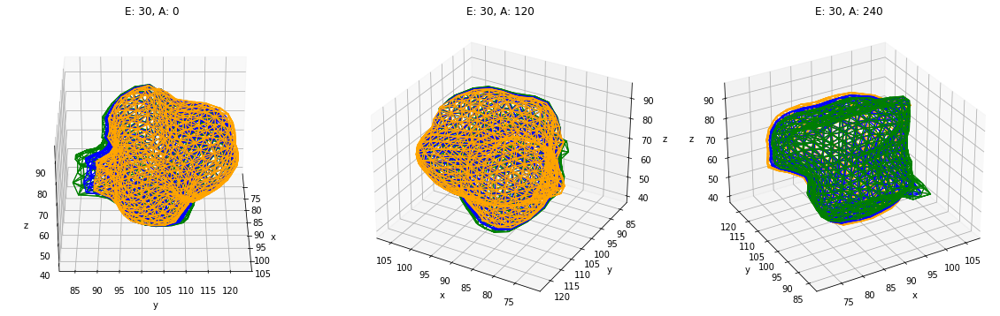

Male


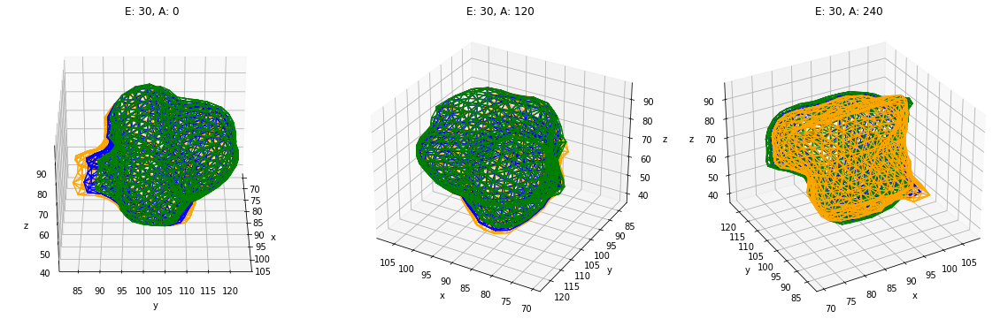

In [27]:
for mode in range(0, 5):
    print(f'Mode: {mode}')
    (mode_pos_0, mode_neg_0) = shape_model_sex_0.mode(mode, 3)
    (mode_pos_1, mode_neg_1) = shape_model_sex_1.mode(mode, 3)
    mode_0 = np.concatenate([
        np.expand_dims(mode_pos_0, 0),
        np.expand_dims(shape_model_sex_0.mean, 0),
        np.expand_dims(mode_neg_0, 0),
    ])
    mode_1 = np.concatenate([
        np.expand_dims(mode_pos_1, 0),
        np.expand_dims(shape_model_sex_1.mean, 0),
        np.expand_dims(mode_neg_1, 0),
    ])
    edge_colors = ['orange', 'blue', 'green']
    labels = ['+ve', 'mean', '-ve']
    print('Female')
    coma.utils.visualise.plot_wireframes(
        mode_0,
        faces,
        elevations=[30],
        azimuths=3,
        edge_colors=edge_colors,
        labels=labels,
    )
    print('Male')
    edge_colors = ['green', 'blue', 'orange']
    coma.utils.visualise.plot_wireframes(
        mode_1,
        faces,
        elevations=[30],
        azimuths=3,
        edge_colors=edge_colors,
        labels=labels,
    )

Mode: 1
Male


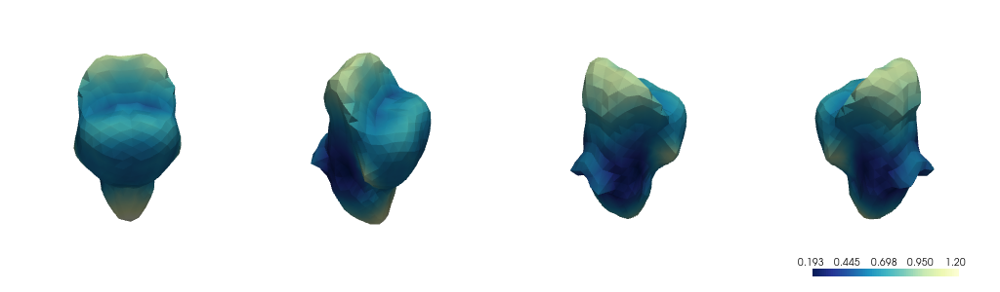

Female


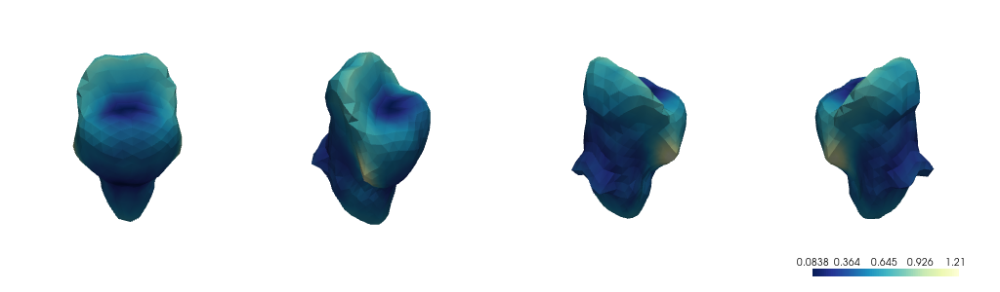

Mode: 2
Male


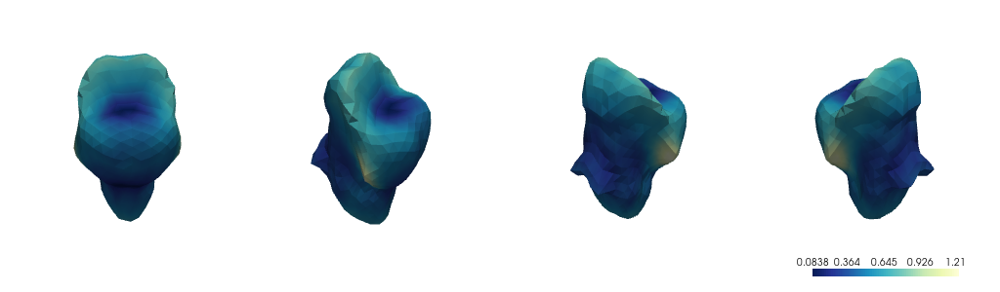

Female


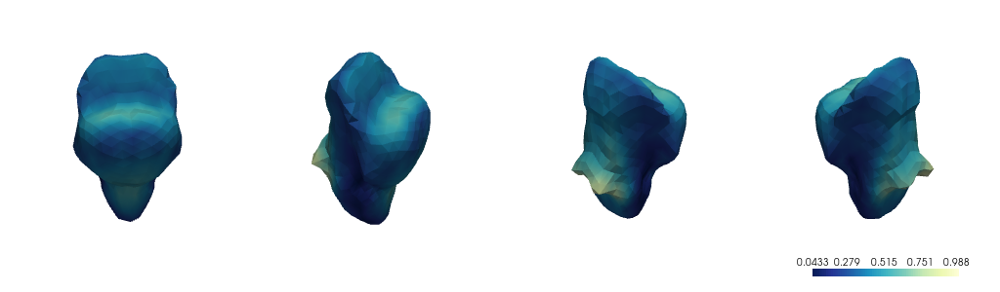

Mode: 3
Male


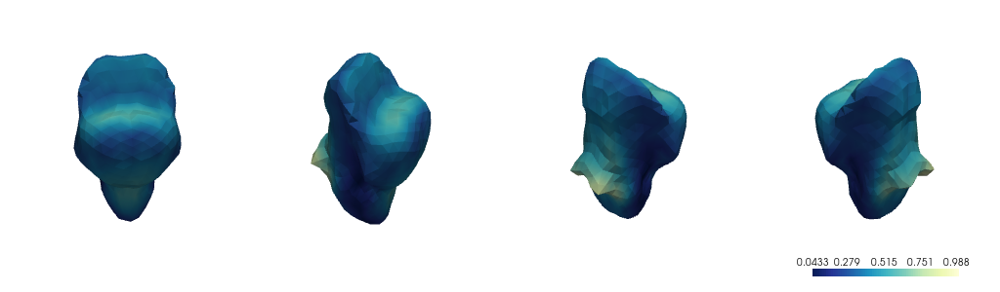

Female


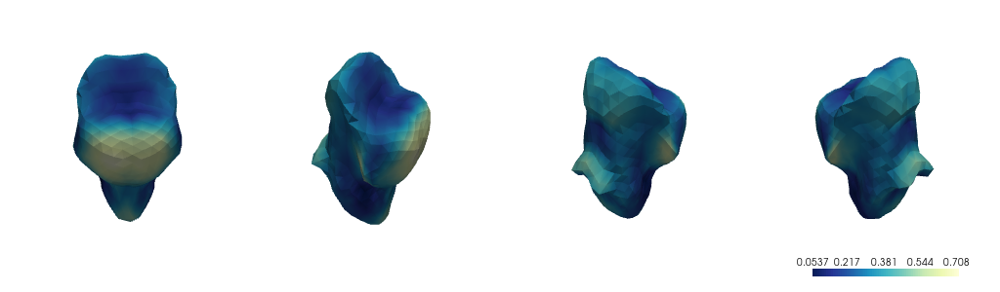

Mode: 4
Male


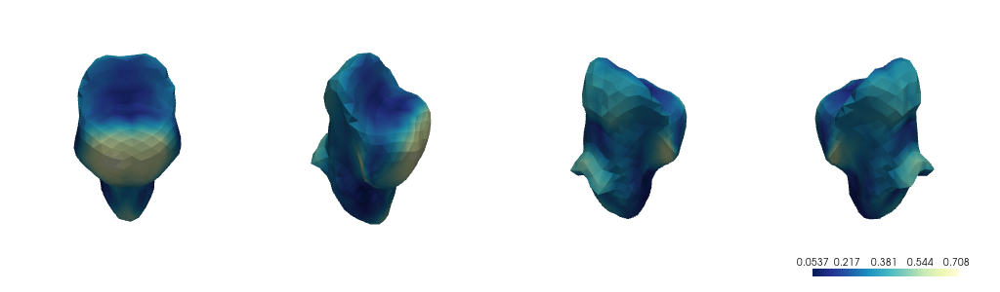

Female


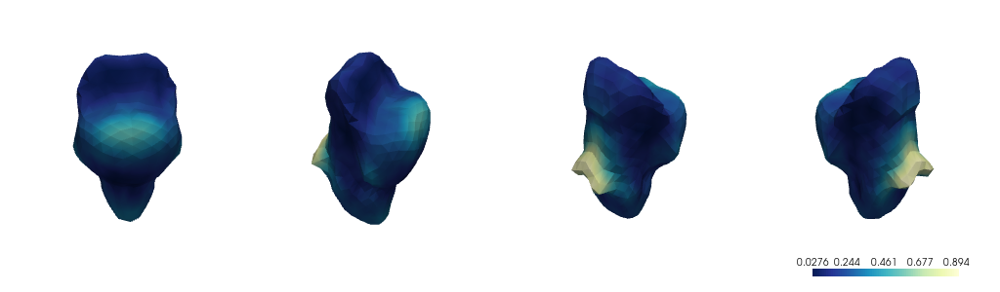

Mode: 5
Male


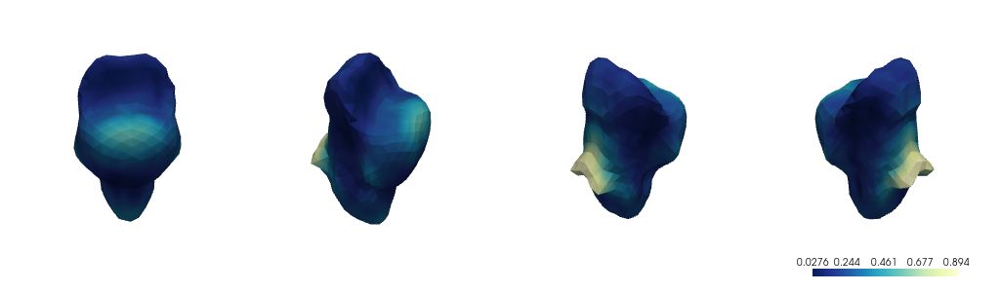

Female


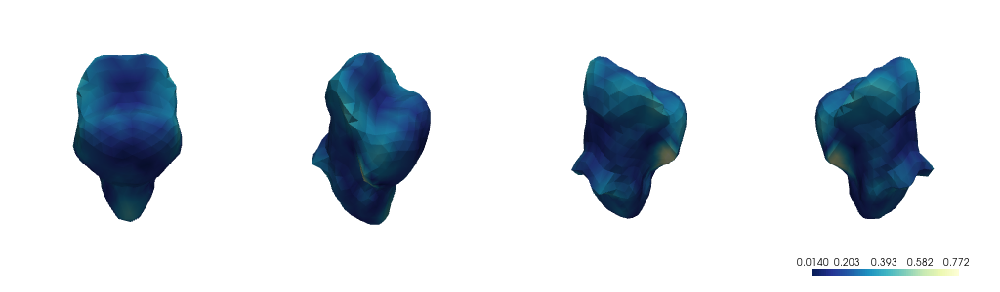

Mode: 6
Male


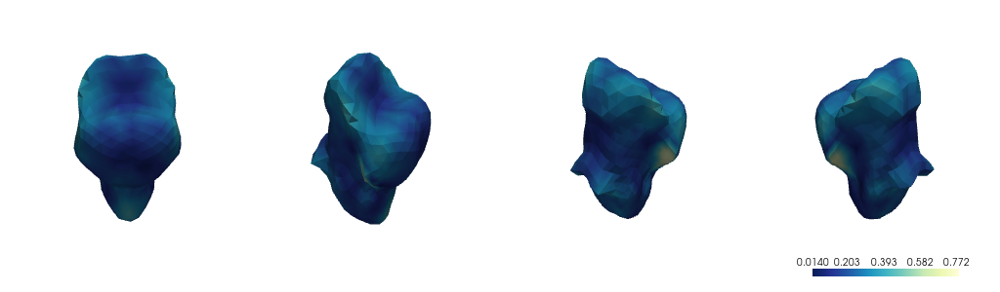

Female


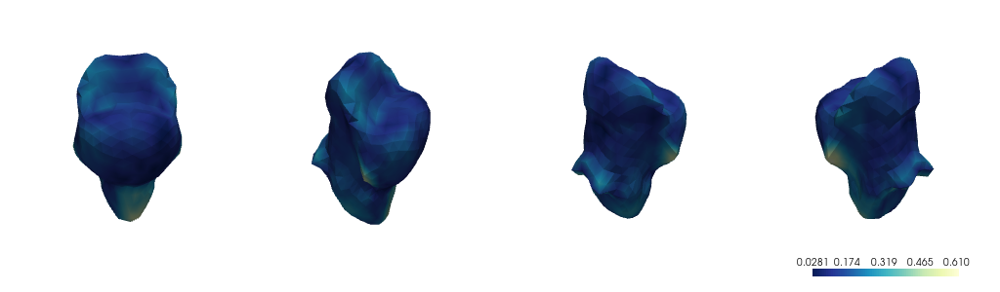

Mode: 7
Male


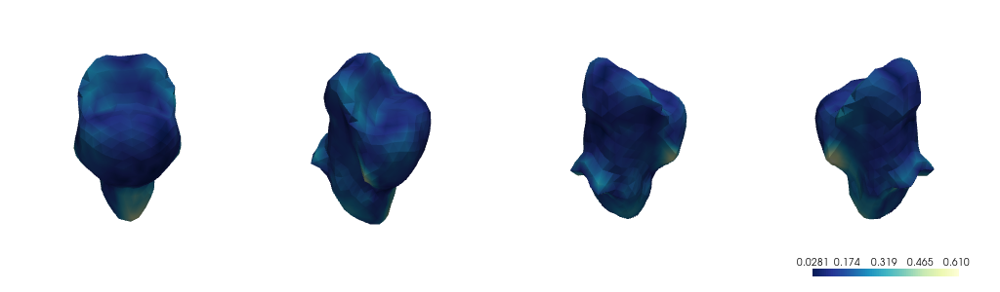

Female


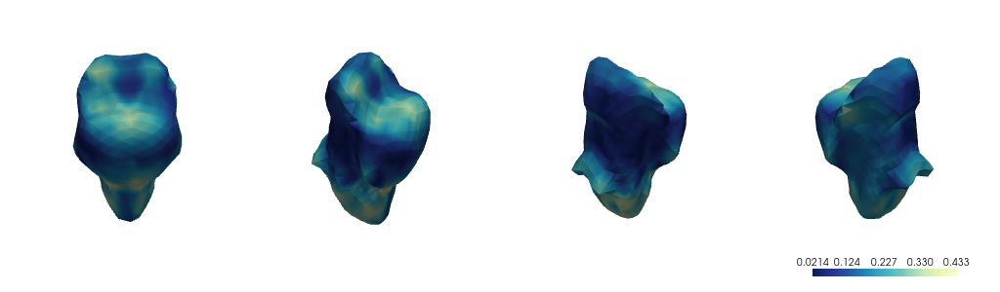

Mode: 8
Male


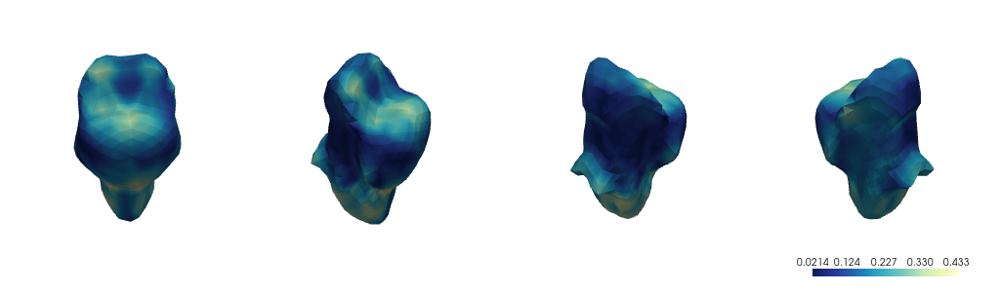

Female


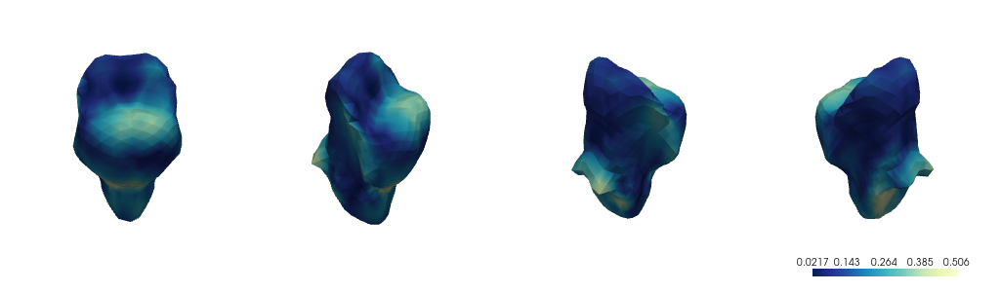

In [28]:
template_copy_male = template.copy()
template_copy_male.points = shape_model_sex_0.mean

template_copy_female = template.copy()
template_copy_female.points = shape_model_sex_1.mean

modes = 8
diff_maps = np.zeros((modes * 2, 642))  # Male and Female

for mode in range(0, modes):
    # Males
    (mode_pos, _) = shape_model_sex_0.mode(mode, 1)
    dist = np.sqrt(((shape_model_sex_0.mean - mode_pos) ** 2).sum(axis=1))
    diff_maps[mode] = dist
    # Female
    (mode_pos, _) = shape_model_sex_1.mode(mode, 1)
    dist = np.sqrt(((shape_model_sex_1.mean - mode_pos) ** 2).sum(axis=1))
    diff_maps[mode + 1] = dist
    
# diff_maps = (diff_maps - diff_maps.min()) / (diff_maps.max() - diff_maps.min())

for mode in range(0, modes):
    print(f'Mode: {mode + 1}')
    print('Male')
    plotter = pv.Plotter(
        shape=(1, 4),
        window_size=(1024, 300),
        border=False,
        lighting='light_kit',
        off_screen=True,
        notebook=True,
    )
    plot_mesh_pyvista(
        plotter,
        template_copy_male,
        rotations=[(0, 0, -45), (0, 0, 20), (0, 0, 85), (0, 0, 185),],
        vertexcolors=list(diff_maps[mode]),
        vertexscalar='distance',
    )
    plotter.show()
    
    print('Female')
    plotter = pv.Plotter(
        shape=(1, 4),
        window_size=(1024, 300),
        border=False,
        lighting='light_kit',
        off_screen=True,
        notebook=True,
    )
    plot_mesh_pyvista(
        plotter,
        template_copy_female,
        rotations=[(0, 0, -45), (0, 0, 20), (0, 0, 85), (0, 0, 185),],
        vertexcolors=list(diff_maps[mode + 1]),
        vertexscalar='distance',
    )
    plotter.show()

#### Filtered by Age

In [29]:
age_range = features.age.max() - features.age.min()
min_age = features.age.min()
buckets = 3
bucket_size = age_range // buckets
shape_models = {}

for i in range(buckets):
    lb = min_age + bucket_size * i
    ub = min_age + bucket_size * (i + 1)
    # print(lb, ub)
    mask = (features.age.values >= lb) & (features.age.values < ub)
    meshes_bucket = meshes[mask]
    shape_models[(lb, ub)] = coma.utils.decomposition.PCAShapeModel3D()
    # print(meshes_bucket.shape)
    shape_models[(lb, ub)].fit(meshes_bucket)

Mode: 0
(40, 50)


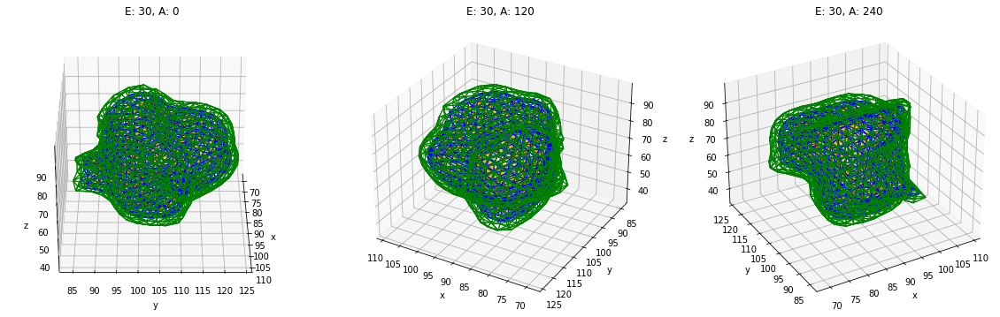

(50, 60)


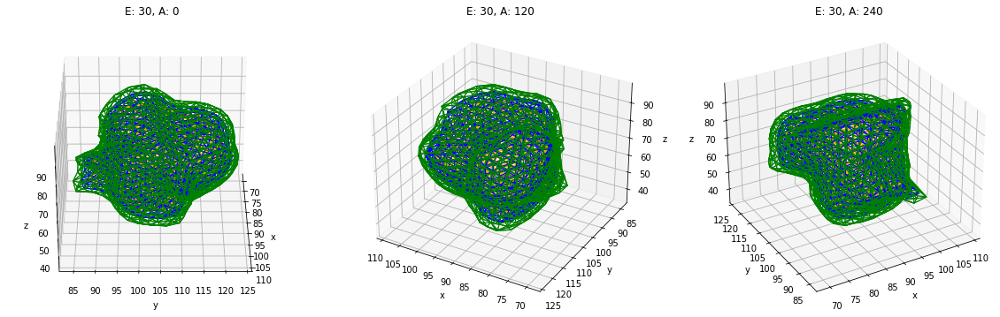

(60, 70)


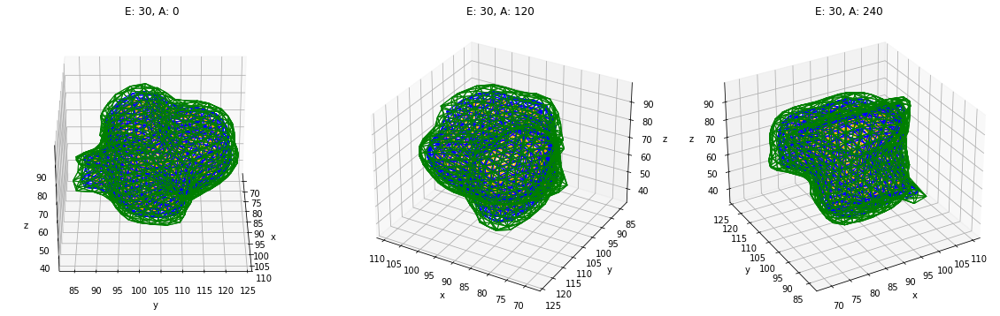

Mode: 1
(40, 50)


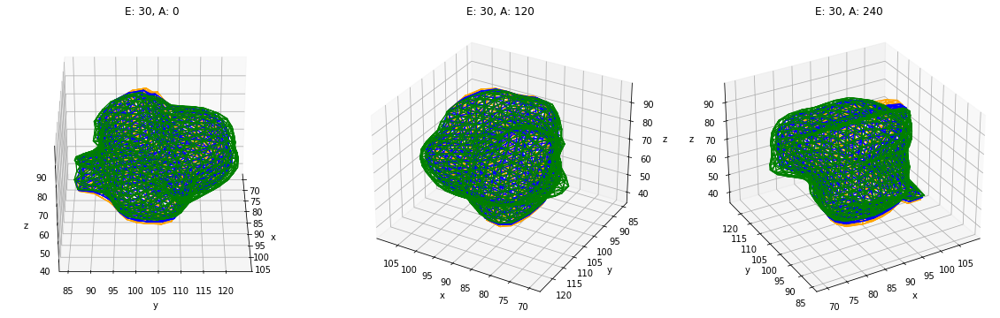

(50, 60)


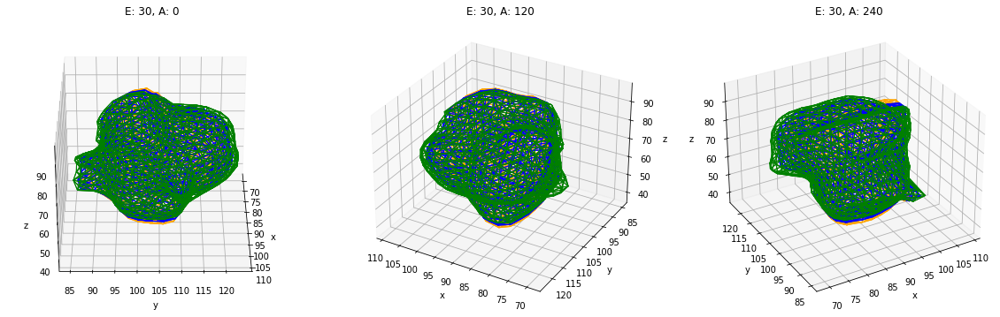

(60, 70)


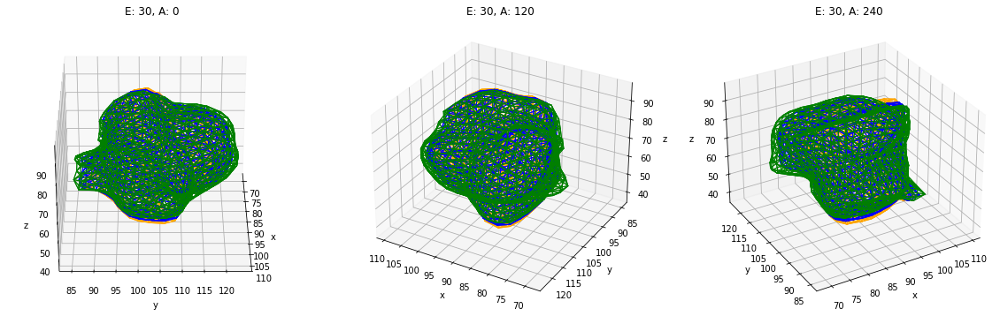

Mode: 2
(40, 50)


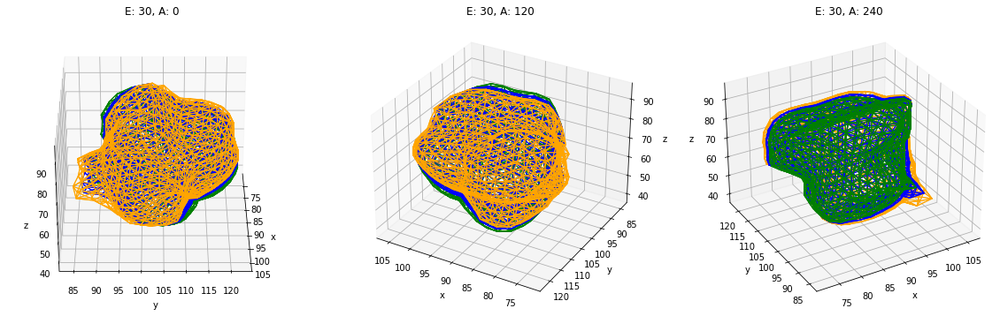

(50, 60)


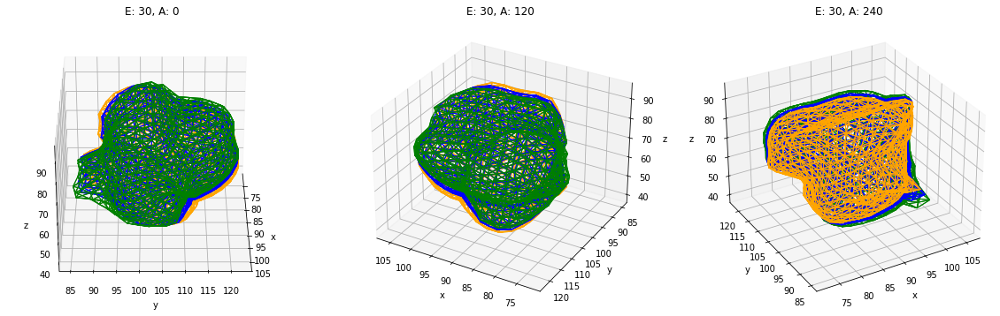

(60, 70)


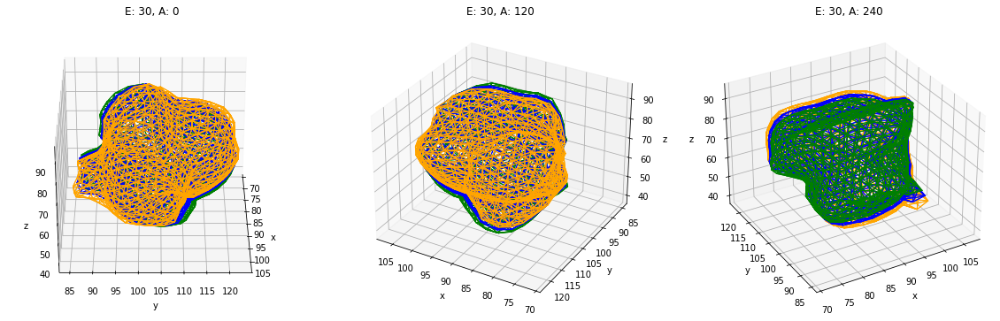

Mode: 3
(40, 50)


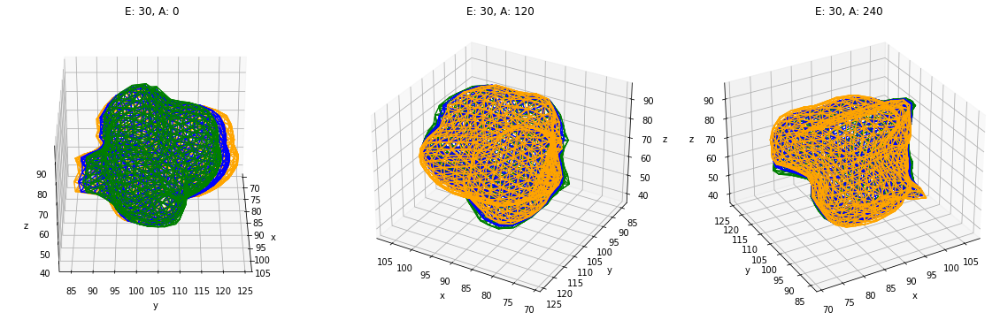

(50, 60)


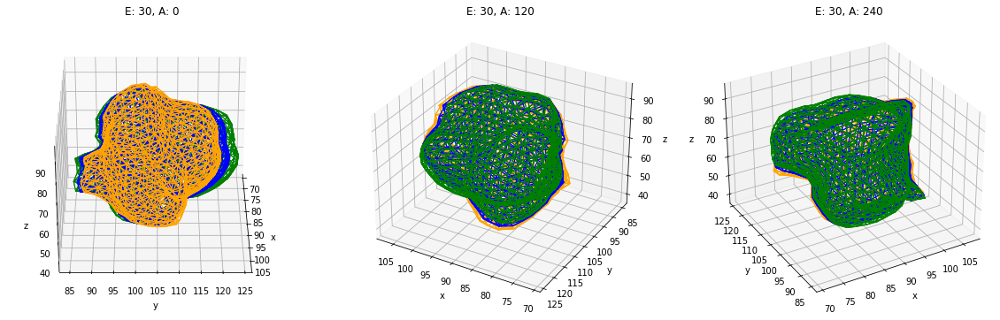

(60, 70)


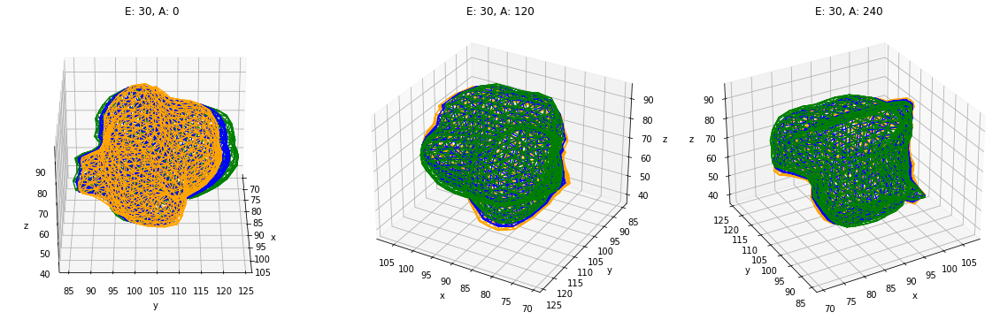

Mode: 4
(40, 50)


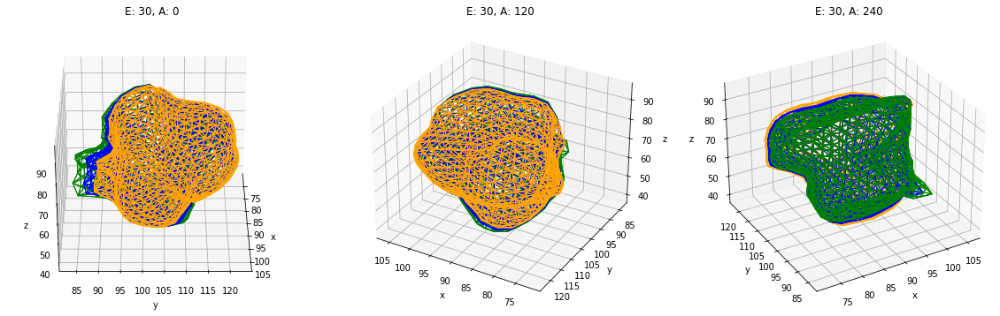

(50, 60)


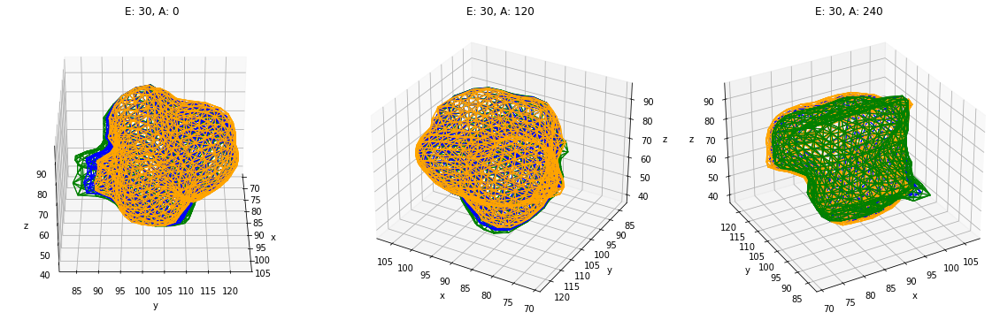

(60, 70)


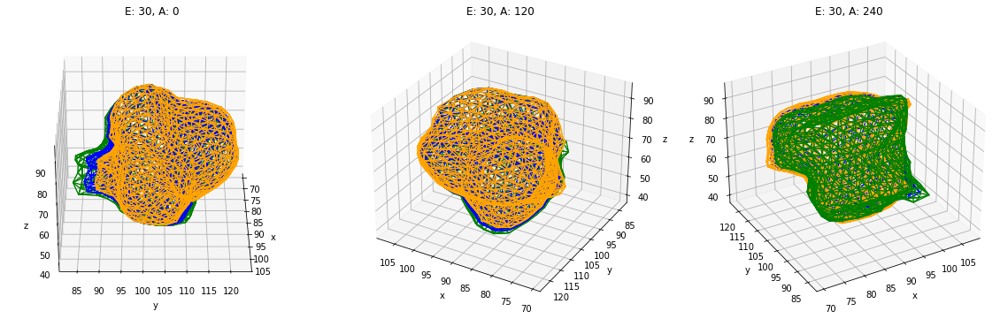

In [30]:
edge_colors = ['orange', 'blue', 'green']
labels = ['+ve', 'mean', '-ve']

for mode in range(0, 5):
    print(f'Mode: {mode}')
    for ages, model in shape_models.items():
        print(ages)
        (shape_mode_pos, shape_mode_neg) = model.mode(mode, 3)
        shape_list = np.concatenate([
            np.expand_dims(shape_mode_pos, 0),
            np.expand_dims(model.mean, 0),
            np.expand_dims(shape_mode_neg, 0),
        ])
        coma.utils.visualise.plot_wireframes(
            shape_list,
            faces,
            elevations=[30],
            azimuths=3,
            edge_colors=edge_colors,
            labels=labels,
        )

In [35]:
def plot_diff_map_in_notebook(template, diff_map):
    plotter = pv.Plotter(
        shape=(1, 4),
        window_size=(1024, 300),
        border=False,
        lighting='light_kit',
        off_screen=True,
        notebook=True,
    )
    plot_mesh_pyvista(
        plotter,
        template,
        rotations=[(0, 0, -45), (0, 0, 20), (0, 0, 85), (0, 0, 185),],
        vertexcolors=list(diff_map),
        vertexscalar='distance',
    )
    plotter.show()
    
def calculate_shape_model_diff(shape_model, mode):
    (mode_pos, _) = shape_model.mode(mode, 1)
    dist = np.sqrt(((shape_model.mean - mode_pos) ** 2).sum(axis=1))
    return dist

Mode: 1
(40, 50)


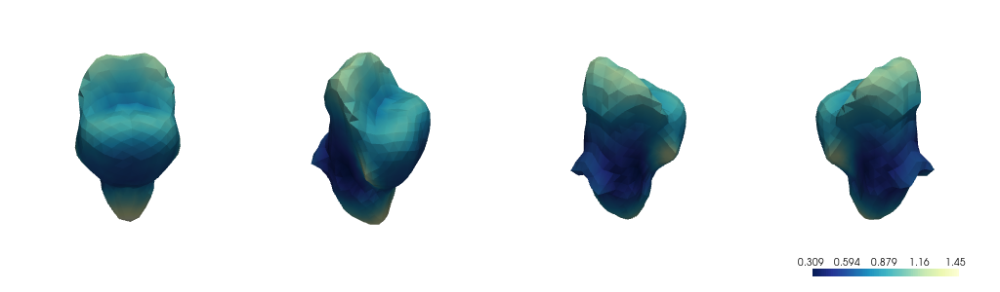

(50, 60)


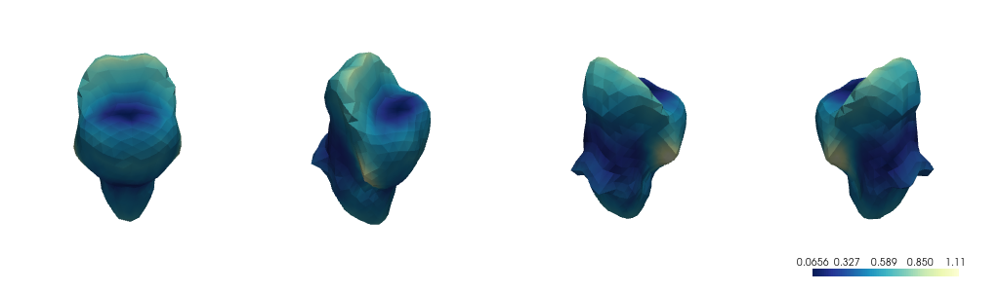

(60, 70)


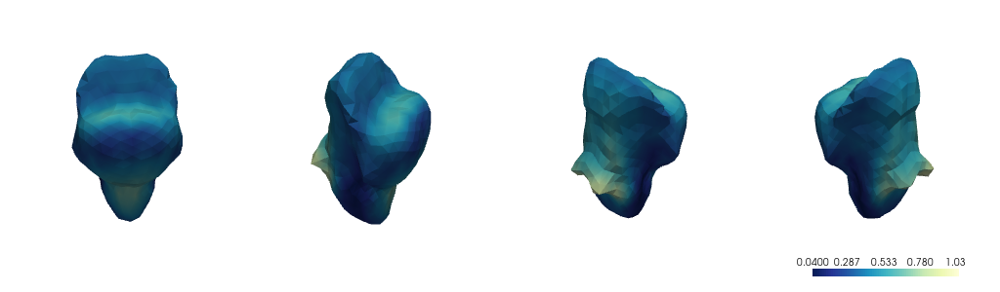

Mode: 2
(40, 50)


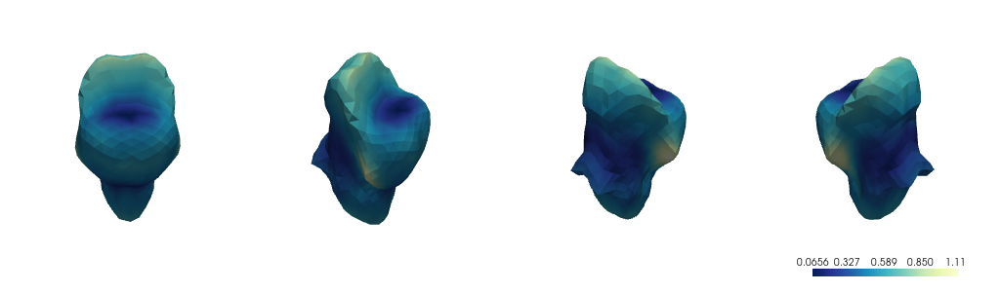

(50, 60)


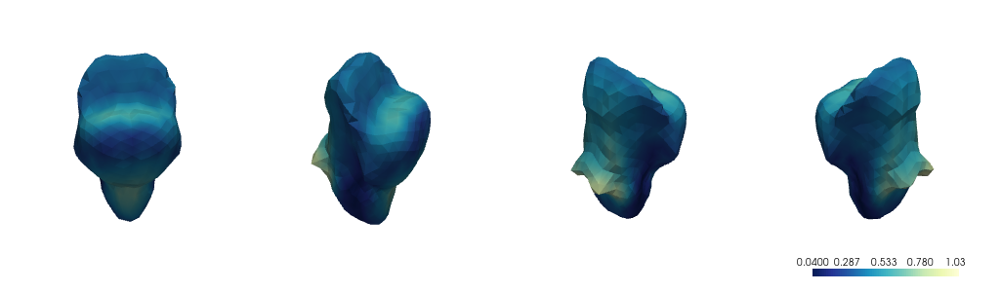

(60, 70)


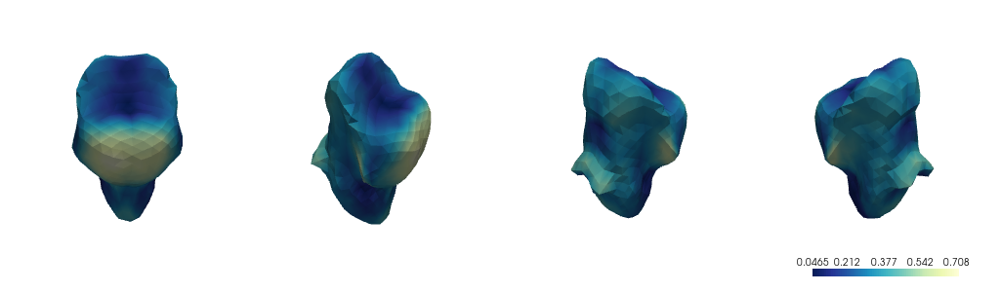

Mode: 3
(40, 50)


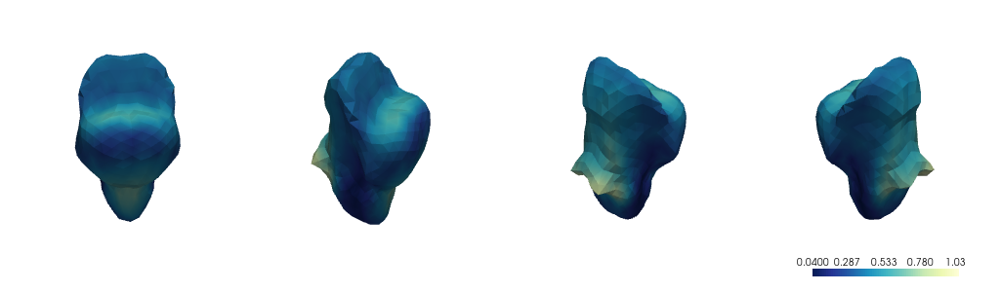

(50, 60)


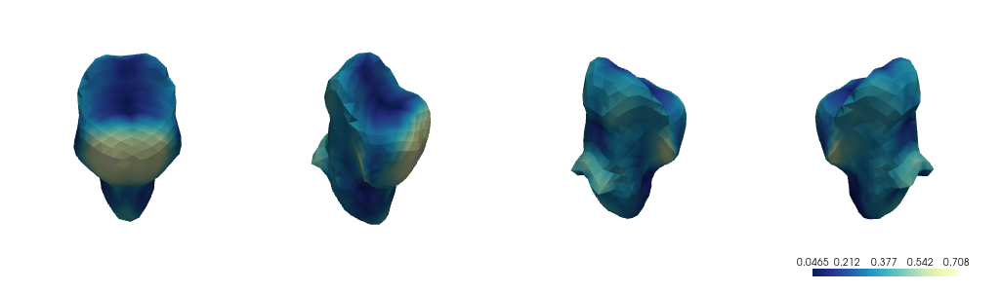

(60, 70)


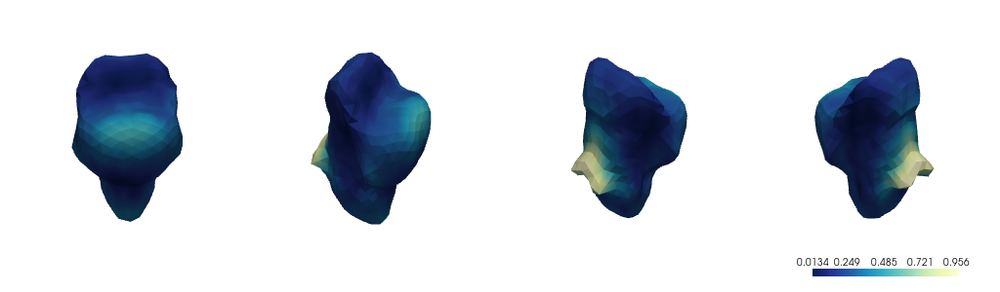

Mode: 4
(40, 50)


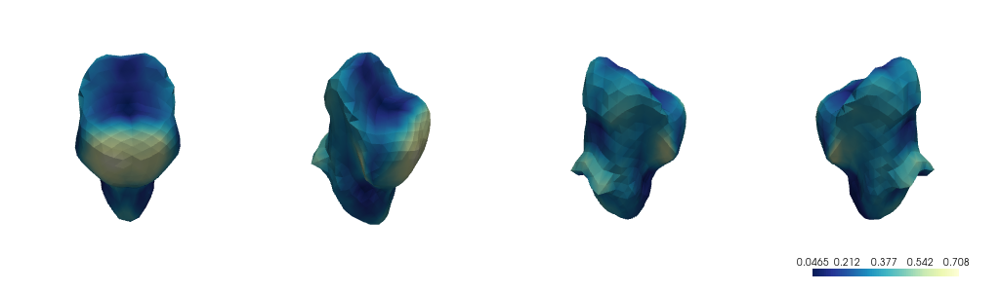

(50, 60)


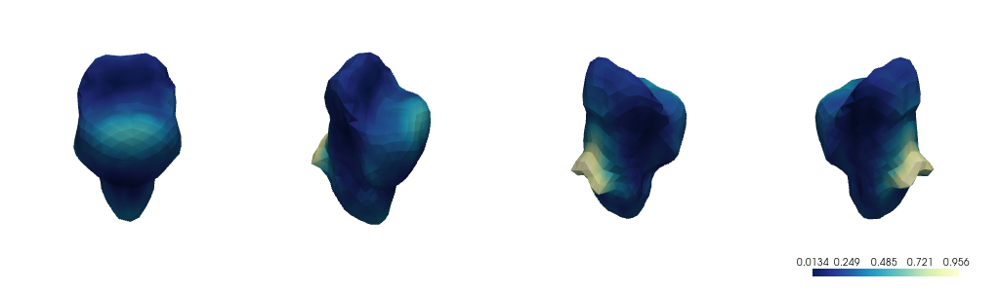

(60, 70)


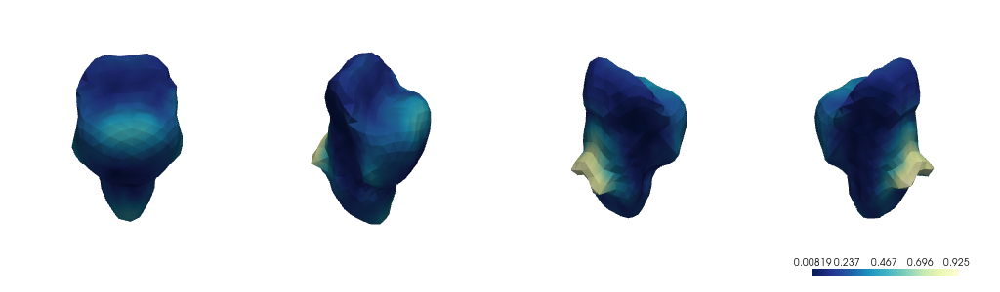

Mode: 5
(40, 50)


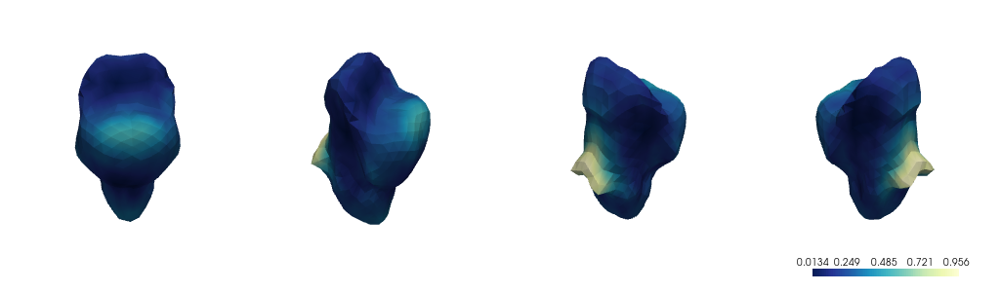

(50, 60)


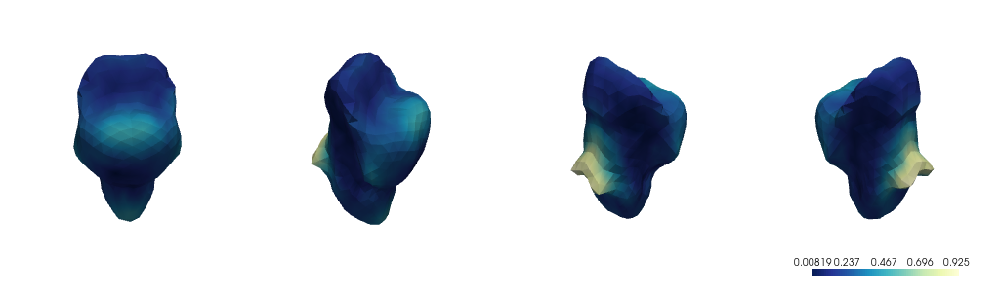

(60, 70)


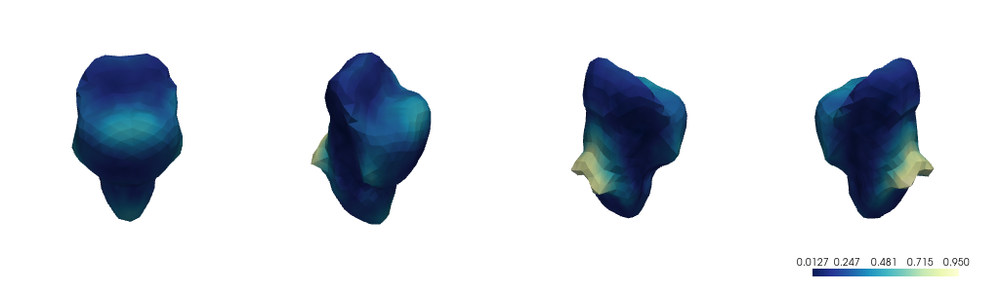

In [36]:
templates = {}
for ages, model in shape_models.items():
    template_copy = template.copy()
    template_copy.points = model.mean
    templates[ages] = template_copy

modes = 8
diff_maps = np.zeros((modes * buckets, 642))

for mode in range(0, 5):
    for i, (ages, model) in enumerate(shape_models.items()):
        diff_maps[mode + i] = calculate_shape_model_diff(model, mode)

# diff_maps = (diff_maps - diff_maps.min()) / (diff_maps.max() - diff_maps.min())

for mode in range(0, 5):
    print(f'Mode: {mode + 1}')
    for i, (ages, template) in enumerate(templates.items()):
        print(f'{ages}')
        plot_diff_map_in_notebook(template, diff_maps[mode + i])